In [1]:
import numpy as np
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import torch
import cv2
import pandas as pd
from torchvision.transforms.functional import affine, adjust_brightness, adjust_contrast
from PIL import Image, ImageFilter
from skimage.util import random_noise
from skimage.metrics import peak_signal_noise_ratio
from skimage import filters, feature, exposure
from scipy import ndimage

In [2]:
def create_matches_plot(detectors, image, transformed_images, kp_number=10):
    i = 1
    fig = plt.figure(figsize=(50, 70))
    for detector_name, detector in detectors.items():
        kp1, des1 = detector.detectAndCompute(image,None)
        for image_name, transformed in transformed_images.items():
            kp2, des2 = detector.detectAndCompute(transformed,None)
            matcher = cv2.DescriptorMatcher_create(cv2.DescriptorMatcher_BRUTEFORCE)
            matches = matcher.match(des1, des2)
            matches = sorted(matches, key=lambda x: x.distance)
            matches = matches[:kp_number]
    
            img_matches = np.empty((max(image.shape[0], transformed.shape[0]),
                                    image.shape[1]+transformed.shape[1], 3), dtype=np.uint8)
            cv2.drawMatches(image, kp1, transformed, kp2, matches, img_matches, flags=2)
            
            fig.add_subplot(len(detectors) * len(transformed_images),1 , i)
            plt.xlabel(f"Detector {detector_name} on {image_name} image")
            plt.imshow(img_matches)
            i += 1
            

In [3]:
img_path = "sudoku dataset/image1019.jpg"
img = Image.open(img_path).resize([480, 480])


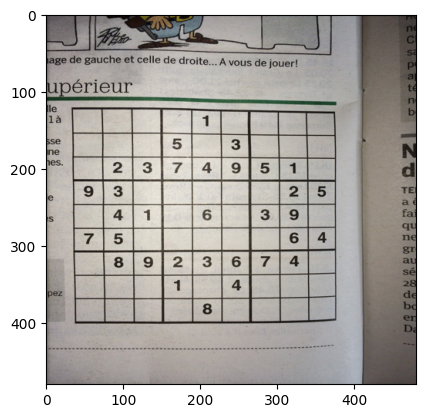

In [4]:
plt.imshow(img)

# Аффинные преобразования

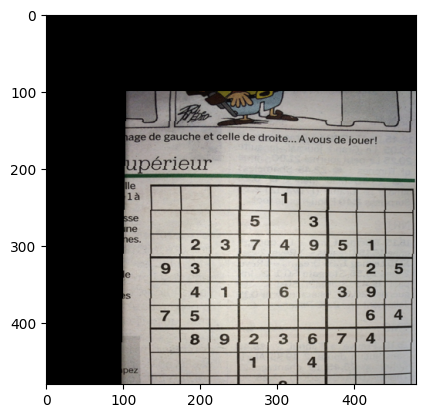

In [5]:
# Cдвиг
translated_img = affine(img, 0, [100, 100], 1, 1)
plt.imshow(translated_img)

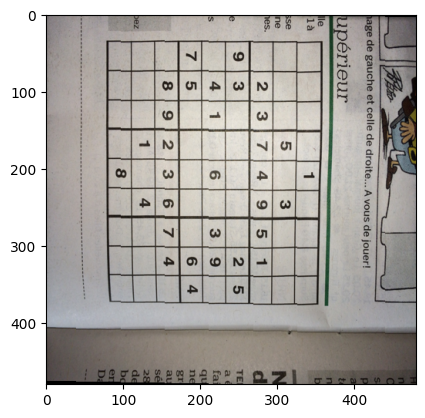

In [6]:
# Поворот
rotated_img = affine(img, 90, [0, 0], 1, 1)
plt.imshow(rotated_img)

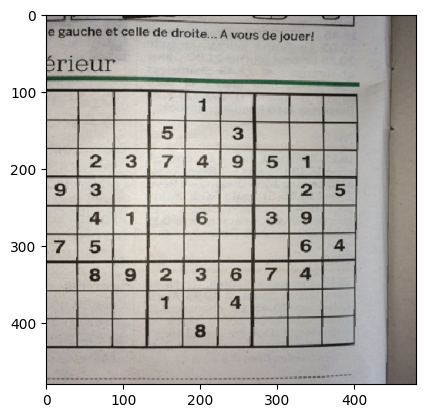

In [7]:
# Масштабирование
scaled_img = affine(img, 0, [0, 0], 1.2, 1)
plt.imshow(scaled_img)

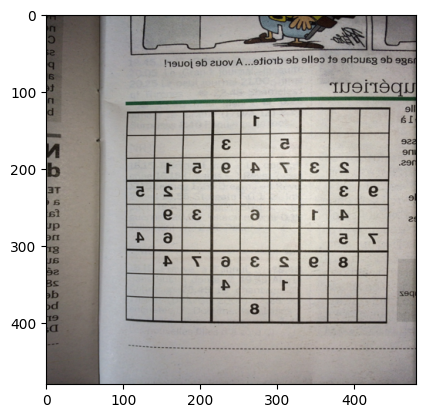

In [8]:
# Отражение
reflected_img = torch.flip(transforms.ToTensor()(img), (2,)).permute(1,2,0)
plt.imshow(reflected_img)

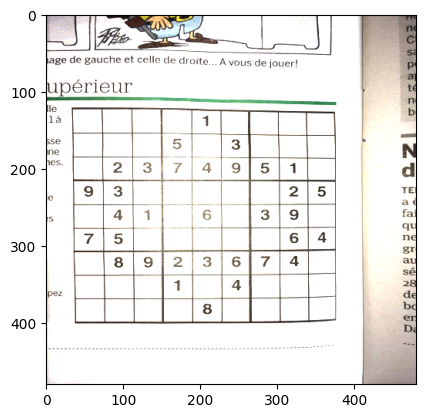

In [9]:
# Увеличение яркости
brighter_img = adjust_brightness(img, 2)
plt.imshow(brighter_img)

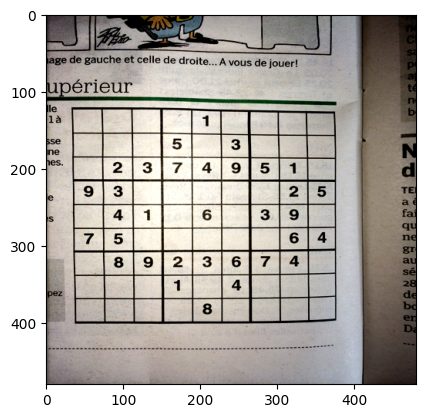

In [10]:
# Изменение контраста
contrasted_img = adjust_contrast(img, 1.5)
plt.imshow(contrasted_img)                

# Наложение шумов и фильтров

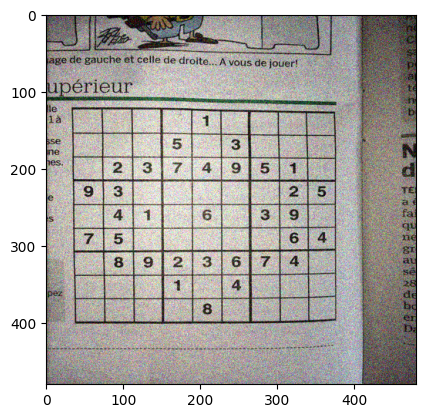

In [11]:
np_img = np.array(img).astype('float64')/255.0
gaussian_noise_img = random_noise(np_img, mode='gaussian', var=0.01)
plt.imshow(Image.fromarray((gaussian_noise_img*255).astype('uint8')))

In [12]:
# Создание зашумленных изображений
noises = []
for i, noise in enumerate(['gaussian', 'salt', 'pepper', 's&p']):
    np_img = np.array(img).astype('float64')/255.0
    
    if noise == 'gaussian':
        noise_img = random_noise(np_img.copy(), mode=noise, var=0.05)
    else:
        noise_img = random_noise(np_img.copy(), mode=noise, amount=0.1)
    noises.append(noise_img)

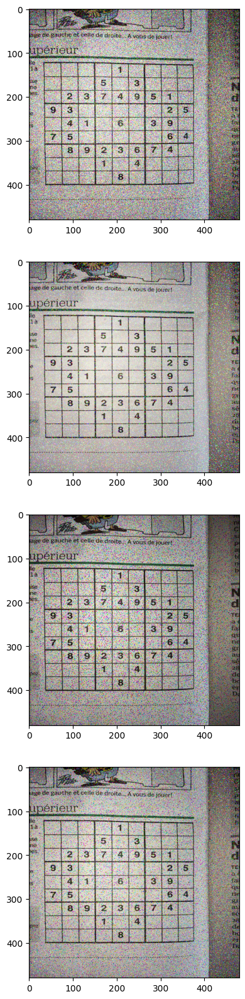

In [13]:
fig = plt.figure(figsize=(20, 20))
for i, noise_img in enumerate(noises):
    fig.add_subplot(4, 1, i + 1)
    
    plt.imshow(Image.fromarray((noise_img*255).astype('uint8')))

PSNR -  13.79819253388462
PSNR -  17.334894672726158
PSNR -  13.918871440585153
PSNR -  15.275701572208632


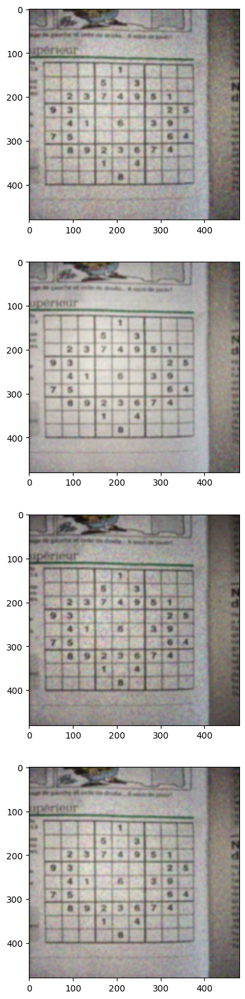

In [14]:
# Гауссовский фильтр
fig = plt.figure(figsize=(20, 20))
for i, noise_img in enumerate(noises):
    fig.add_subplot(4, 1, i + 1)
    print("PSNR - ", peak_signal_noise_ratio(np.array(img).astype('float64')/255.0, noise_img))
    noise_img = Image.fromarray((noise_img*255).astype('uint8'))
    noise_img = noise_img.filter(ImageFilter.GaussianBlur(radius=2))
    plt.imshow(noise_img)

PSNR -  13.79819253388462
PSNR -  17.334894672726158
PSNR -  13.918871440585153
PSNR -  15.275701572208632


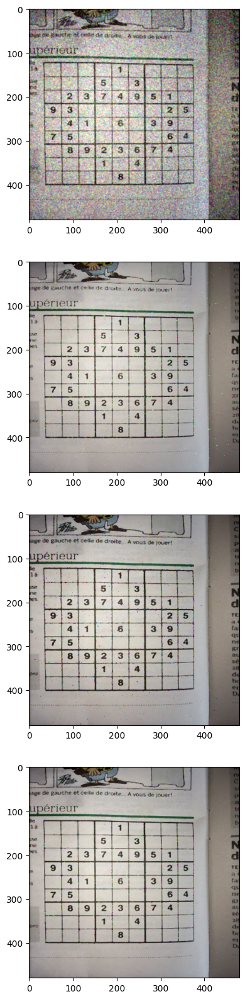

In [15]:
# Медианный фильтр
fig = plt.figure(figsize=(20, 20))
for i, noise_img in enumerate(noises):
    fig.add_subplot(4, 1, i + 1)
    print("PSNR - ", peak_signal_noise_ratio(np.array(img).astype('float64')/255.0, noise_img))
    noise_img = Image.fromarray((noise_img*255).astype('uint8'))
    noise_img = noise_img.filter(ImageFilter.MedianFilter(size=3))
    plt.imshow(noise_img)

# Контуры изображения

In [16]:
matrices = {'roberts': [np.array( [[1, 0 ], [0,-1 ]]), np.array( [[ 0, 1 ], [ -1, 0 ]] )],
           'prewitt': [np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]]), np.array([[-1, -1, -1], [0, 0, 0], [1, 1, 1]])],
           'sobel': [np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]]), np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])],
           'laplacian': [np.array([[0, -1, 0], [-1, 4, -1], [0, -1, 0]]), np.array([[-1, -1, -1], [-1, 8, -1], [-1, -1, -1]])]}

In [17]:
orig_img = cv2.imread(img_path)
orig_img = cv2.resize(orig_img, [480, 480])
img_gray = cv2.cvtColor(orig_img, cv2.COLOR_BGR2GRAY)
blured = cv2.GaussianBlur(img_gray, (5, 5), sigmaX=3)
norm_blured = blured/255
#img_gray = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2GRAY)

roberts
prewitt
sobel
laplacian


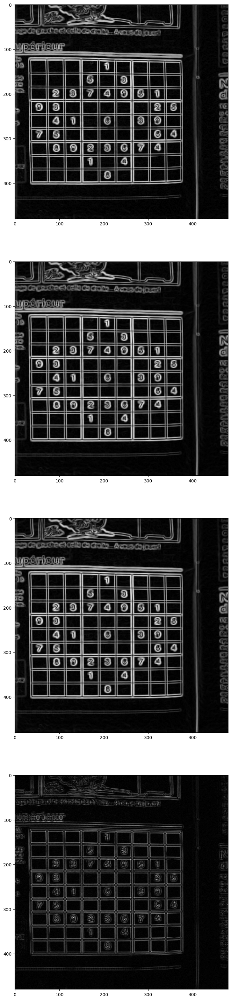

In [18]:
fig = plt.figure(figsize=(40, 40))
for i, matrix in enumerate(matrices): 
    print(matrix)
    fig.add_subplot(4, 1, i + 1)
    vertical = ndimage.convolve( norm_blured, matrices[matrix][0] ) 
    horizontal = ndimage.convolve( norm_blured, matrices[matrix][1] ) 
  
    edged_img = np.sqrt( np.square(horizontal) + np.square(vertical)) 
    #edged_img*=255
    #edged_img = edged_img[:,:,::-1]
    plt.imshow(edged_img, cmap='gray')
    #cv2.imshow('123', edged_img)
    #cv2.waitKey(0)

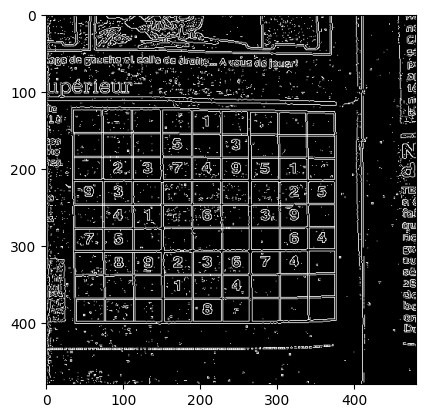

In [19]:
#img_gray = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

canny = cv2.Canny(img_gray, 50, 50)
plt.imshow(canny, cmap='gray')
#cv2.imshow('123', canny)
#cv2.waitKey(0)

# Исследование детекторов и дескрипторов

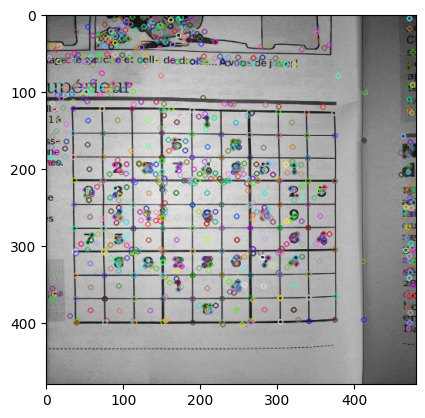

In [20]:
# SIFT
sift = cv2.SIFT_create()
kp = sift.detect(img_gray,None)
kp_img = cv2.drawKeypoints(img_gray, kp, None)
plt.imshow(kp_img)
#cv2.imshow('123', kp_img)
#cv2.waitKey(0)

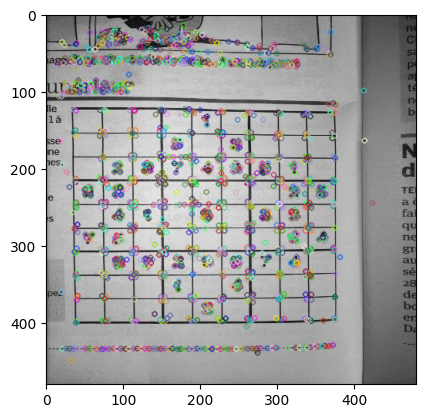

In [21]:
# BRISK
brisk = cv2.BRISK_create()
kp = brisk.detect(img_gray,None)
kp_img = cv2.drawKeypoints(img_gray, kp, None)
plt.imshow(kp_img)

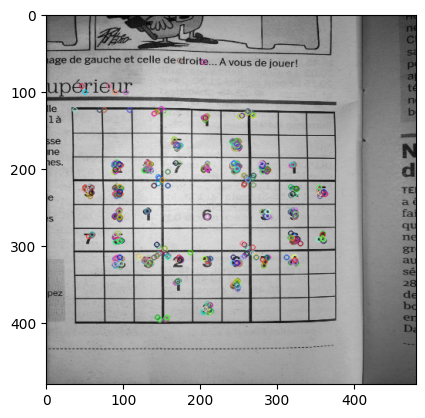

In [22]:
# ORB
orb = cv2.ORB_create()
kp, des = orb.detectAndCompute(img_gray,None)
kp_img = cv2.drawKeypoints(img_gray, kp, None)
plt.imshow(kp_img)

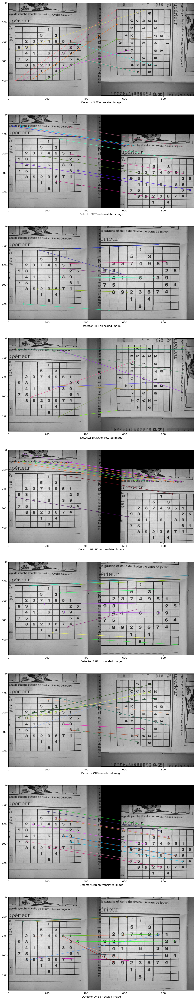

In [23]:
transformed_images = [cv2.cvtColor(np.array(x), cv2.COLOR_BGR2GRAY) for x in [rotated_img, translated_img, scaled_img]]
transformed_images = {k: v for (k, v) in zip(['rotated', 'translated', "scaled"], transformed_images)}

create_matches_plot({'SIFT': sift, 'BRISK': brisk, 'ORB': orb}, img_gray, transformed_images)

# 3 Распознавание изображений

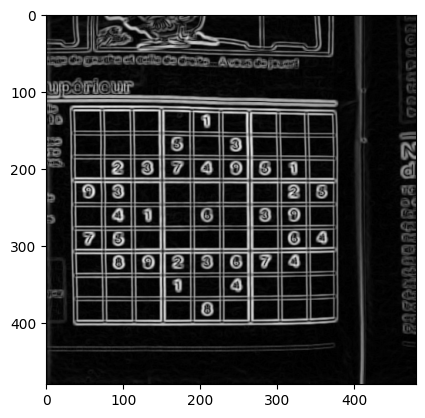

In [24]:
vertical = ndimage.convolve( norm_blured, matrices['sobel'][0] ) 
horizontal = ndimage.convolve( norm_blured, matrices['sobel'][1] ) 
  
edged_img = np.sqrt( np.square(horizontal) + np.square(vertical)) 
plt.imshow(edged_img, cmap='gray')

(480, 480)
48.19520125961233


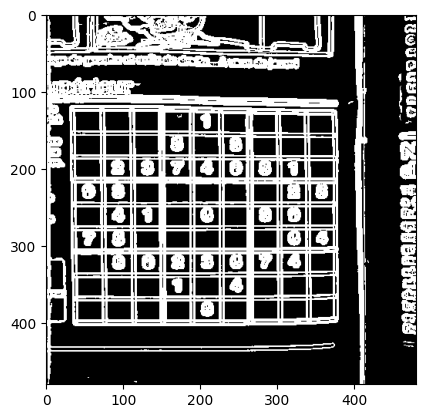

In [25]:
copy = np.copy(edged_img)
copy *= 255
print(copy.shape)
print(copy.mean())
edges = np.where(copy > 30 , 255, 0).astype('uint8')
plt.imshow(edges, cmap='gray')

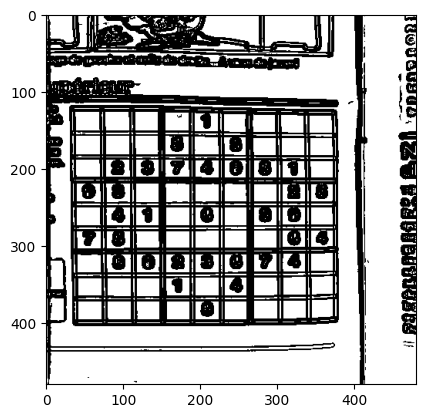

In [26]:
kernel = np.ones((1, 1), np.uint8)
img_copy = edges.copy()
img_copy = 255 - img_copy
plt.imshow(img_copy, cmap='gray')
erosion = cv2.erode(img_copy, kernel, iterations = 1)
#erosion = cv2.morphologyEx(img_copy, cv2.MORPH_CLOSE, kernel)
#erosion = 255 - erosion
plt.imshow(erosion, cmap='gray')

(1, 900, 3)


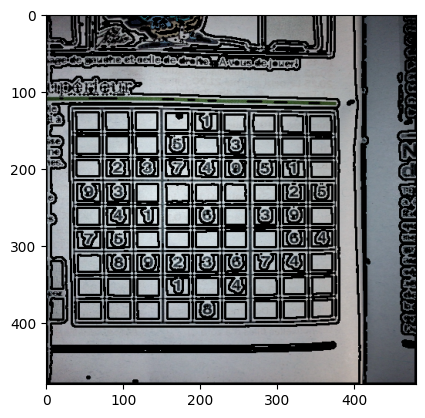

In [27]:
contours, hierarchy = cv2.findContours(erosion, cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)
print(hierarchy[:,:,1:].shape)
contoured = orig_img.copy()
contoured = cv2.drawContours(contoured, contours, -1, (0,0,0), 2,)
plt.imshow(contoured, cmap='gray')

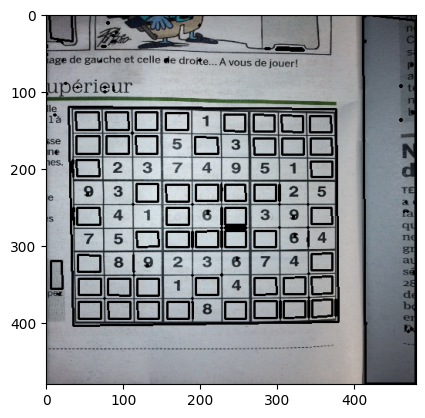

In [28]:
rectangles = []
for contour in contours:
    #print(contour.shape, contour)
    approx = cv2.approxPolyDP(contour, 0.02 * cv2.arcLength(contour, True), True)
    if len(approx) == 4:
        rectangles.append(approx)
rect_contoured = orig_img.copy()
contoured = cv2.drawContours(rect_contoured, rectangles, -1, (0,0,0), 2)
plt.imshow(contoured)

In [29]:
def get_sudoku_contours(image, convolve_matrix=None, method=cv2.RETR_LIST):
    if convolve_matrix is None:
        convolve_matrix = [np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]]), np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])]
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    image = cv2.GaussianBlur(image, (5, 5), sigmaX=3)
    
    
    #vertical = ndimage.convolve( image, convolve_matrix[0] ) 
    #horizontal = ndimage.convolve( image, convolve_matrix[1] ) 
    #edged_img = np.sqrt( np.square(horizontal) + np.square(vertical)) * 255
    
    #edges = np.where(edged_img > threshold , 255, 0).astype('uint8')
    edged_img = image
    #plt.imshow(edges_img, cmap='gray')
    edges = cv2.adaptiveThreshold(edged_img.astype('uint8'), 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY,11,2)
    print(np.unique(edges))
    
    kernel = np.ones((3, 3), np.uint8)
    #edges = 255 - edges
    #edges = cv2.erode(edges, kernel, iterations = 1)
    edges = cv2.morphologyEx(edges, cv2.MORPH_OPEN, kernel)
    plt.imshow(edges, cmap="gray")
    contours, hierarchy = cv2.findContours(edges, method , cv2.CHAIN_APPROX_SIMPLE)
    rectangles = []
    for contour in contours:
        #print(contour.shape, contour)
        approx = cv2.approxPolyDP(contour, 0.02 * cv2.arcLength(contour, True), True)
        if len(approx) == 4:
            rectangles.append(approx)
    return np.array(rectangles)

[  0 255]
216


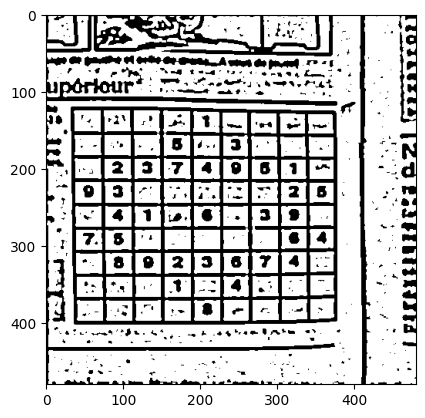

In [30]:
contours = get_sudoku_contours(orig_img, method=cv2.RETR_CCOMP)
contours = np.squeeze(contours, 2)

areas = (contours[:, 1, 0] - contours[:, 0, 0]) * (contours[:, 2, 1] - contours[:, 1, 1])

max_rectangle = np.argmax(areas)
print(max_rectangle)
rect_contoured = orig_img.copy()
#rect_contoured = cv2.drawContours(rect_contoured, [contours[max_rectangle]], -1, (0,0,0), 2)
rect_contoured = cv2.drawContours(rect_contoured, contours, -1, (0,0,0), 2)
#plt.imshow(rect_contoured)

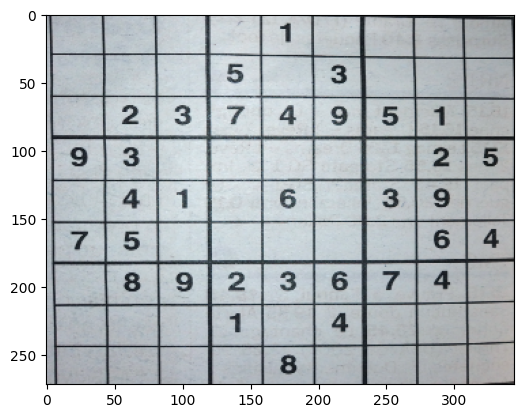

In [31]:
sudoku_borders = contours[max_rectangle]

sudoku_grid = orig_img[sudoku_borders[1, 1]:sudoku_borders[2, 1], sudoku_borders[0, 0]:sudoku_borders[1, 0]]
plt.imshow(sudoku_grid)

[  0 255]


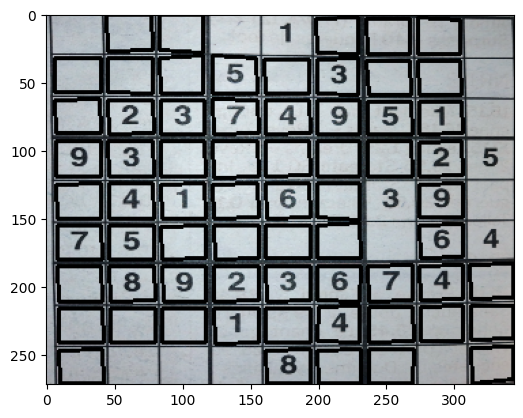

In [32]:
sudoku_contours = get_sudoku_contours(sudoku_grid, method=cv2.RETR_EXTERNAL)
sudoku_contoured = sudoku_grid.copy()
sudoku_contoured = cv2.drawContours(sudoku_contoured, sudoku_contours, -1, (0,0,0), 2)
plt.imshow(sudoku_contoured)

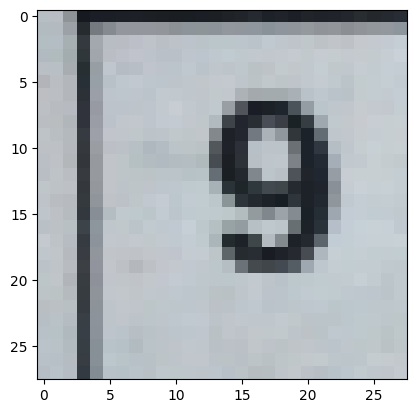

In [33]:
sudoku_grid = cv2.resize(sudoku_grid, (28 * 9, 28 * 9))
sudoku_parts = []
for i in range(9):
    for j in range(9):
        sudoku_parts.append(sudoku_grid[i * 28: (i + 1) * 28, j * 28: (j + 1) * 28])
sudoku_parts = np.array(sudoku_parts).reshape((9, 9, 28, 28, 3))
plt.imshow(sudoku_parts[3][0])

In [34]:
mnist_train = pd.read_csv

In [35]:
def split_image_for_sudoku(image):
    contours = get_sudoku_contours(image, method=cv2.RETR_CCOMP)
    contours = np.squeeze(contours, 2)

    areas = (contours[:, 1, 0] - contours[:, 0, 0]) * (contours[:, 2, 1] - contours[:, 1, 1])

    max_rectangle = np.argmax(areas)
    
    sudoku_borders = contours[max_rectangle]

    sudoku_grid = image[sudoku_borders[1, 1]:sudoku_borders[2, 1], sudoku_borders[0, 0]:sudoku_borders[1, 0]]

    sudoku_grid = cv2.resize(sudoku_grid, (28 * 9, 28 * 9))
    sudoku_parts = []
    for i in range(9):
        for j in range(9):
            sudoku_parts.append(sudoku_grid[i * 28: (i + 1) * 28, j * 28: (j + 1) * 28])
    return sudoku_parts

[  0 255]


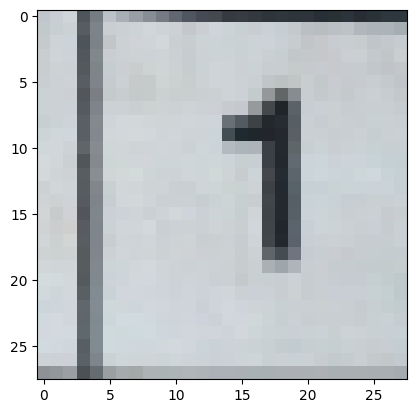

In [36]:
plt.imshow(split_image_for_sudoku(orig_img)[4])

In [37]:
def image_preprocess(image, shape=None):
    if shape:
        image = image.reshape(shape)
    image = cv2.adaptiveThreshold(image, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY,11,2)
    return image

[  0 255]


error: OpenCV(4.8.1) D:\a\opencv-python\opencv-python\opencv\modules\imgproc\src\thresh.cpp:1674: error: (-215:Assertion failed) src.type() == CV_8UC1 in function 'cv::adaptiveThreshold'


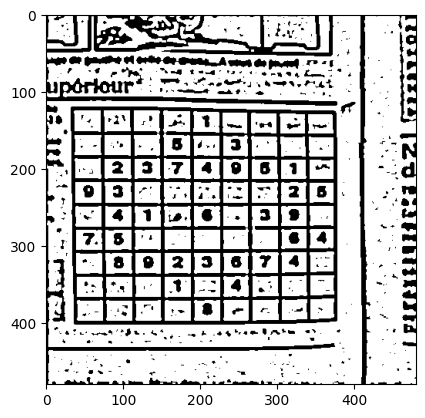

In [38]:
plt.imshow(image_preprocess(split_image_for_sudoku(orig_img)[4]))

In [ ]:
split_image_for_sudoku(orig_img)[4]

In [ ]:
def image_preprocess(image, shape=None):
    if len(image.shape) == 3:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    if shape:
        image = image.reshape(shape)
    
    t, image = cv2.threshold(cv2.cvtColor(sudoku_grid[28], cv2.COLOR_BGR2GRAY), 100, 255, cv2.THRESH_BINARY)
    contours, hierarchy = cv2.findContours(image, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    mask = np.zeros(shape=(28, 28))
    mask = 255 - mask
    image = cv2.drawContours(mask, contours, -1, (0, 0, 0), 1,)
    return image

In [ ]:
def get_hog(image, shape=(28, 28), preprocess=True, to_pandas=False):
    if not isinstance(image, np.ndarray):
        image = image.to_numpy()
    if preprocess:
        image = image_preprocess(image.astype('uint8'), shape)
    fd, hog_image = hog(image, orientations=8, pixels_per_cell=(4, 4),
                    cells_per_block=(1, 1), visualize=True)
    if to_pandas:
        hog_image = hog_image.reshape(-1)
    return hog_image

In [ ]:
get_hog(np.resize(orig_img, (28, 28)))

In [ ]:
np.resize(orig_img, (28, 28)).shape